![图片描述](./image/channel_strategy.png)

我们使用全市场的A股日data_folder进行测试，只做多头。

资金管理方法和上个策略一样。

假设初始资金有1个亿。

假设手续费为万分之二。

首先，计算过去60日的最高价和最低价(不包含当前bar),当收盘价小于60日最低价的时候，并且没有持多头仓位，开多；当收盘价大于60日最高价的时候，如果持有多头仓位，平多。

加载data_folder完毕
2005-01-04, total_value : 100000000.0
2005-01-05,  BUY : data_name:000001.XSHE price : 177.62 , cost : 71048.0 , commission : 14.2096
2005-01-05,  BUY : data_name:000002.XSHE price : 139.84 , cost : 69920.0 , commission : 13.984000000000002
2005-01-05,  BUY : data_name:000004.XSHE price : 37.86 , cost : 71934.0 , commission : 14.3868
2005-01-05,  BUY : data_name:000005.XSHE price : 13.01 , cost : 72856.0 , commission : 14.571200000000001
2005-01-05,  BUY : data_name:000006.XSHE price : 23.46 , cost : 75072.0 , commission : 15.0144
2005-01-05,  BUY : data_name:000007.XSHE price : 17.97 , cost : 73677.0 , commission : 14.7354
2005-01-05,  BUY : data_name:000008.XSHE price : 21.07 , cost : 73745.0 , commission : 14.749000000000002
2005-01-05,  BUY : data_name:000009.XSHE price : 10.96 , cost : 75624.0 , commission : 15.124800000000002
2005-01-05,  BUY : data_name:000010.XSHE price : 14.52 , cost : 74052.0 , commission : 14.8104
2005-01-05,  BUY : data_name:000011.XSHE pric

Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,51.30,2008-01-15,2008-11-04,2014-05-28,1662
1,27.83,2005-03-09,2005-07-18,2006-06-02,323
2,26.66,2015-08-17,2015-09-15,2015-11-10,62
3,24.90,2017-11-13,2018-10-18,2020-02-10,586
4,15.53,2015-06-11,2015-07-08,2015-07-20,28


Stress Events,mean,min,max
Lehman,-0.58%,-5.48%,6.52%
US downgrade/European Debt Crisis,-0.17%,-3.07%,1.16%
Fukushima,0.00%,-0.75%,0.56%
EZB IR Event,-0.02%,-1.94%,1.72%
Aug07,0.22%,-2.54%,1.63%
Mar08,-0.52%,-5.22%,2.12%
Sept08,-0.30%,-4.49%,6.52%
2009Q1,0.17%,-0.61%,1.10%
2009Q2,0.01%,-0.04%,0.50%
Flash Crash,-0.36%,-1.43%,0.82%


Top 10 long positions of all time,max
000631.XSHE,1.12%
000650.XSHE,0.96%
600137.XSHG,0.86%
000156.XSHE,0.63%
000620.XSHE,0.60%
000592.XSHE,0.58%
600187.XSHG,0.55%
300446.XSHE,0.51%
601882.XSHG,0.48%
600629.XSHG,0.48%


Top 10 short positions of all time,max


Top 10 positions of all time,max
000631.XSHE,1.12%
000650.XSHE,0.96%
600137.XSHG,0.86%
000156.XSHE,0.63%
000620.XSHE,0.60%
000592.XSHE,0.58%
600187.XSHG,0.55%
300446.XSHE,0.51%
601882.XSHG,0.48%
600629.XSHG,0.48%


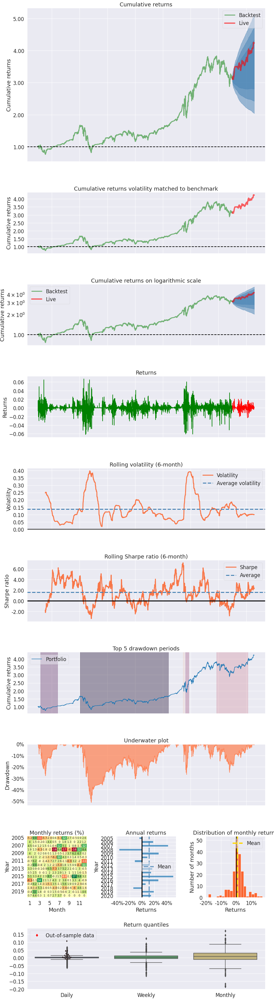

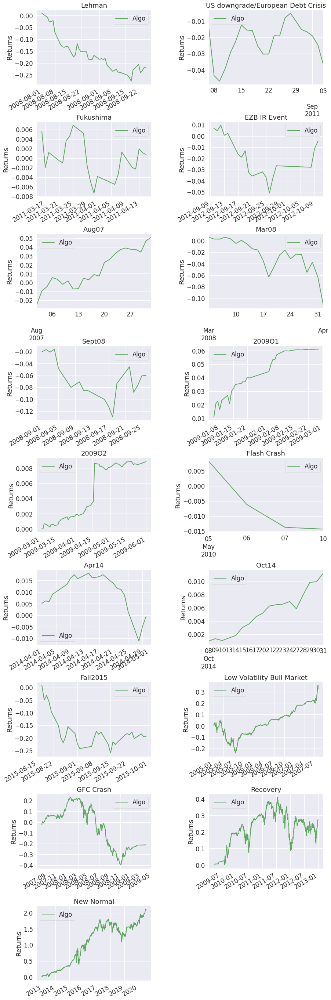

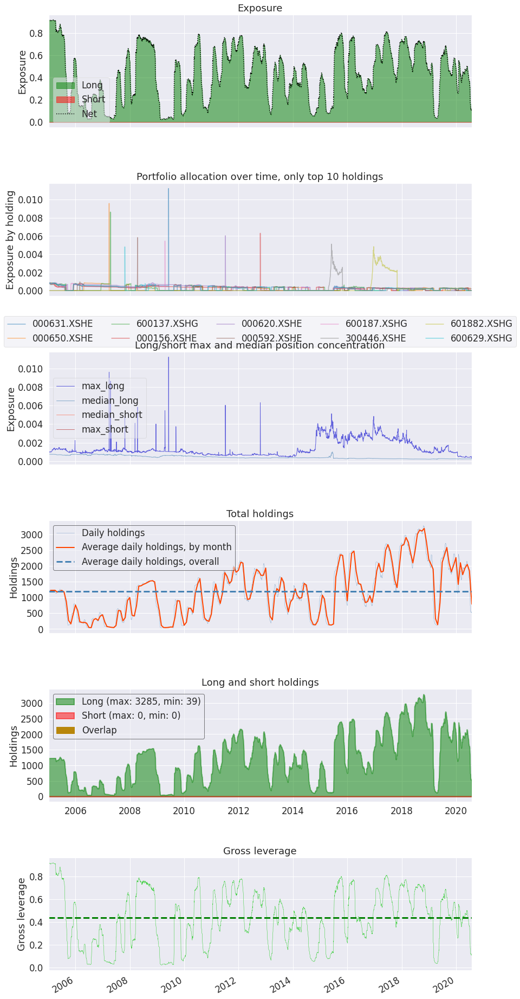

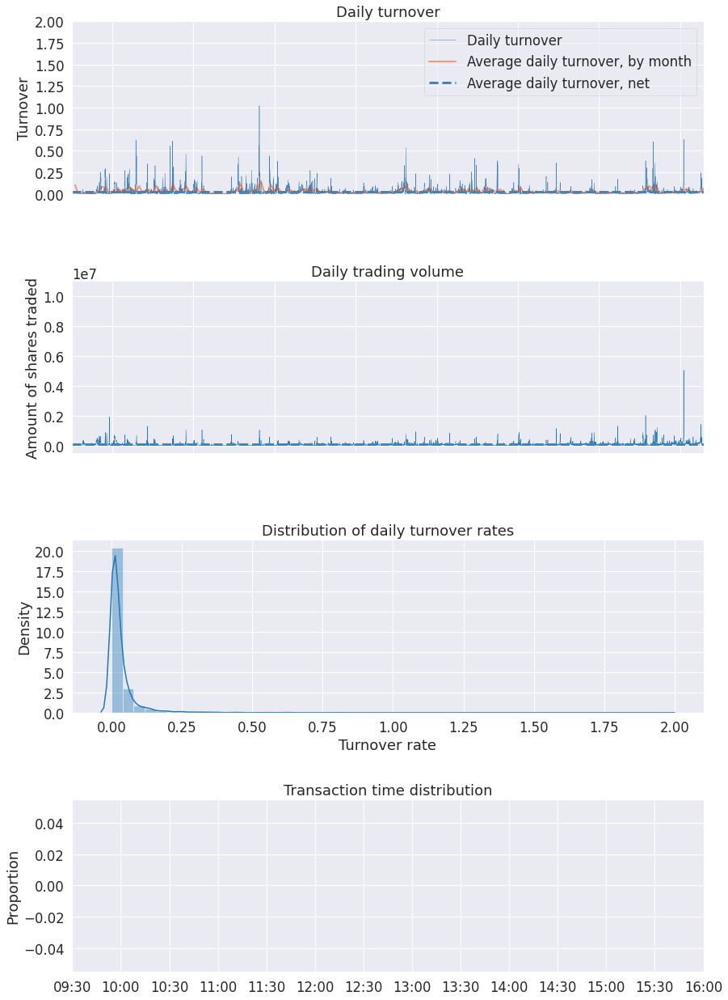

In [1]:
import backtesting as bt
import datetime
import pandas as pd
import numpy as np
import os,sys
import copy
import talib
import math 
import warnings
warnings.filterwarnings("ignore")
import pyfolio as pf

# 我们使用的时候，直接用我们新的类读取data_folder就可以了。
class test_two_ma_strategy(bt.Strategy):
   
    params = (('period',60),
             
             )

    def log(self, txt, dt=None):
        ''' Logging function fot this strategy'''
        dt = dt or self.datas[0].datetime.date(0)
        print('{}, {}'.format(dt.isoformat(), txt))

    def __init__(self):
        # Keep a reference to the "close" line in the data[0] dataseries
        self.bar_num=0
        # 保存最高价最低价data_folder
        self.stock_highest_dict={data._name:bt.indicators.Highest(data,period = self.p.period) for data in self.datas}
        self.stock_lowest_dict={data._name:bt.indicators.Lowest(data,period = self.p.period) for data in self.datas}
        
        # 保存现有持仓的股票
        self.position_dict={}
        # 当前有交易的股票
        self.stock_dict={}
        
       
    def prenext(self):
        
        self.next()
        
        
    def next(self):
        # 假设有100万资金，每次成份股调整，每个股票使用1万元
        self.bar_num+=1
        
        # 前一交易日和当前的交易日
        pre_date = self.datas[0].datetime.date(-1).strftime("%Y-%m-%d")
        current_date = self.datas[0].datetime.date(0).strftime("%Y-%m-%d")
        # 总的价值
        total_value = self.broker.get_value()
        total_cash  = self.broker.get_cash()
        self.log(f"total_value : {total_value}")
        # 第一个data_folder是指数，校正时间使用，不能用于交易
        # 循环所有的股票,计算股票的数目
        for data in self.datas[1:]:
            data_date = data.datetime.date(0).strftime("%Y-%m-%d")
            # 如果两个日期相等，说明股票在交易
            if current_date == data_date:
                stock_name = data._name
                if stock_name not in self.stock_dict:
                    self.stock_dict[stock_name]=1
        total_target_stock_num = len(self.stock_dict)
        # 现在持仓的股票数目
        total_holding_stock_num = len(self.position_dict)
        # 计算理论上的手数
        if total_holding_stock_num<total_target_stock_num:
            now_value = total_cash/(total_target_stock_num-total_holding_stock_num)
            stock_value = total_value/total_target_stock_num
            now_value =min(now_value,stock_value)
        else:
            now_value = total_value/total_target_stock_num
    
        # 循环股票，开始交易
        for data in self.datas[1:]:
            data_date = data.datetime.date(0).strftime("%Y-%m-%d")
            # 如果两个日期相等，说明股票在交易
            if current_date == data_date:
                # 最高价和最低价data_folder，保存成line的格式
                highest_info = self.stock_highest_dict[data._name]
                lowest_info = self.stock_lowest_dict[data._name]
                size = self.getposition(data).size
                # 开多信号
                con_buy =  data.close[0]<lowest_info[-1] and data._name not in self.position_dict
                con_sell = data.close[0]>highest_info[-1]
                # 平多信号
                if con_sell:
                    # 已经下单并且成交了
                    if self.getposition(data).size>0:
                        self.close(data)
                        if data._name in self.position_dict:
                            self.position_dict.pop(data._name)
                        # self.buy_list.remove(stock)
                    # 已经下单，但是订单没有成交
                    if data._name in self.position_dict and size==0:
                        order = self.position_dict[data._name]
                        self.cancel(order)
                        self.position_dict.pop(data._name) 
                # 开多信号,价格站到均线上方，并且持仓量为0 
                if con_buy  :
                    lots = now_value/data.close[0]
                    lots = int(lots/100)*100 # 计算能下的手数，取整数
                    order = self.buy(data,size = lots)
                    self.position_dict[data._name] = order
                
                        
        
    def notify_order(self, order):
        
        if order.status in [order.Submitted, order.Accepted]:
            return
        
        if order.status == order.Rejected:
            self.log(f"Rejected : order_ref:{order.ref}  data_name:{order.p.data._name}")
            
        if order.status == order.Margin:
            self.log(f"Margin : order_ref:{order.ref}  data_name:{order.p.data._name}")
            
        if order.status == order.Cancelled:
            self.log(f"Concelled : order_ref:{order.ref}  data_name:{order.p.data._name}")
            
        if order.status == order.Partial:
            self.log(f"Partial : order_ref:{order.ref}  data_name:{order.p.data._name}")
         
        if order.status == order.Completed:
            if order.isbuy():
                self.log(f" BUY : data_name:{order.p.data._name} price : {order.executed.price} , cost : {order.executed.value} , commission : {order.executed.comm}")

            else:  # Sell
                self.log(f" SELL : data_name:{order.p.data._name} price : {order.executed.price} , cost : {order.executed.value} , commission : {order.executed.comm}")
    
    def notify_trade(self, trade):
        # 一个trade结束的时候输出信息
        if trade.isclosed:
            self.log('closed symbol is : {} , total_profit : {} , net_profit : {}' .format(
                            trade.getdataname(),trade.pnl, trade.pnlcomm))
            # self.trade_list.append([self.datas[0].datetime.date(0),trade.getdataname(),trade.pnl,trade.pnlcomm])
            
        if trade.isopen:
            self.log('open symbol is : {} , price : {} ' .format(
                            trade.getdataname(),trade.price))
    def stop(self):
        
        pass 
                
        
# 初始化cerebro,获得一个实例
cerebro = bt.Cerebro()
# cerebro.broker = bt.brokers.BackBroker(shortcash=True)  # 0.5%
data_root = "./stock/day/"
file_list =sorted(os.listdir(data_root))
params=dict(
    
    fromdate = datetime.datetime(2005,1,4),
    todate = datetime.datetime(2020,7,31),
    timeframe = bt.TimeFrame.Days,
    dtformat = ("%Y-%m-%d"),
    compression = 1,
    datetime = 0,
    open = 1,
    high = 2,
    low =3,
    close =4,
    volume =5,
    openinterest=-1)

# 加载指数data_folder
feed = bt.feeds.GenericCSVData(dataname = "./stock/index.csv",**params)
# 添加data_folder到cerebro
cerebro.adddata(feed, name = 'index')

# 读取data_folder
for file in file_list:
    #剔除不满一年的股票
    if len(pd.read_csv(data_root+file))<252:
        continue
    feed = bt.feeds.GenericCSVData(dataname = data_root+file,**params)
    # 添加data_folder到cerebro
    cerebro.adddata(feed, name = file[:-4])
print("加载data_folder完毕")
# 添加手续费，按照万分之二收取
cerebro.broker.setcommission(commission=0.0002,stocklike=True)
# 设置初始资金为1亿
cerebro.broker.setcash(1_0000_0000)
# 添加策略
cerebro.addstrategy(test_two_ma_strategy)
cerebro.addanalyzer(bt.analyzers.TotalValue, _name='_TotalValue')
cerebro.addanalyzer(bt.analyzers.PyFolio)
# 运行回测
results = cerebro.run()
# 打印相关信息
pyfoliozer = results[0].analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
pf.create_full_tear_sheet(
    returns,
    positions=positions,
    transactions=transactions,
    # gross_lev=gross_lev,
    live_start_date='2019-01-01',
    )
